In [1]:
import scanpy as sc
import anndata
import scenvi

import numpy as np
import umap
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import pickle

CUDA backend failed to initialize: Unable to load cuDNN. Is it installed? (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
/home/chananchidas/miniconda3/envs/scenvi/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# !wget https://dp-lab-data-public.s3.amazonaws.com/ENVI/sc_data.h5ad
#!wget https://dp-lab-data-public.s3.amazonaws.com/ENVI/st_data.h5ad


In [ ]:
# Open vizgen data
st_data = anndata.read_zarr("/home/chananchidas/spatialnichenetr/data/vizgen.zarr/")


In [4]:
# Vizgen data
st_data.X # normalized and scaled
st_data.raw.X # only normalized (by the size of the cell)

array([[0.        , 0.01150496, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.01015443, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.19946588, 0.03767279, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.07850243, 0.07850243, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.05609996, 0.08301224, ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
# st_data.raw = anndata.AnnData(X=st_data.layers["raw_counts"].copy(), obs=st_data.obs, var=st_data.var)
# st_data.write_h5ad("vizgen_data.h5ad")

In [8]:
first_run = False
# Run COVET
if first_run:
    st_data.obsm['COVET'], st_data.obsm['COVET_SQRT'], st_data.uns['CovGenes'] = scenvi.compute_covet(st_data)
    
    print(st_data.obsm['COVET_SQRT'].shape) # (75890, 67, 67)

    # Flatten the data to 2D
    covet_sqrt = np.reshape(st_data.obsm['COVET_SQRT'], (st_data.obsm['COVET_SQRT'].shape[0], -1))

    # Save covet_sqrt
    # np.save("covet_sqrt.npy", covet_sqrt)
    
else:
    covet_sqrt = np.load("../rds/vizgen_covet_sqrt.npy")

In [ ]:
# # Try running different UMAP parameters for the COVET values - but do this on the HPC

# # Store embeddings in empty dictionary
# embeddings = {}

# # Try min_dist = 0, 0.1, 0.25, 0.5, 0.8, 0.99
# # Try n_neighbors = 2, 5, 10, 20, 50, 100
# # Try metric: euclidean, cosine
# min_dist_list = [0, 0.1, 0.25, 0.5, 0.8, 0.99]
# n_neighbors_list = [2, 5, 10, 20, 50, 100]
# metric_list = ['euclidean', 'cosine']

# for metric in metric_list:
#     for min_dist in min_dist_list:
#         for n_neighbors in n_neighbors_list:
#             reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, metric=metric,
#                                 random_state=0)
#             embedding = reducer.fit_transform(covet_sqrt)
#             embeddings[f"neighbors_{n_neighbors}_mindist_{min_dist}_metric_{metric}"] = embedding


# # Save embeddings
# with open(path + 'embeddings.p', 'wb') as fp:
#     pickle.dump(embeddings, fp, protocol=pickle.HIGHEST_PROTOCOL)

In [5]:
# Load pickled embeddings
with open('../rds/vizgen_covet_embeddings.p', 'rb') as fp:
    embeddings = pickle.load(fp)

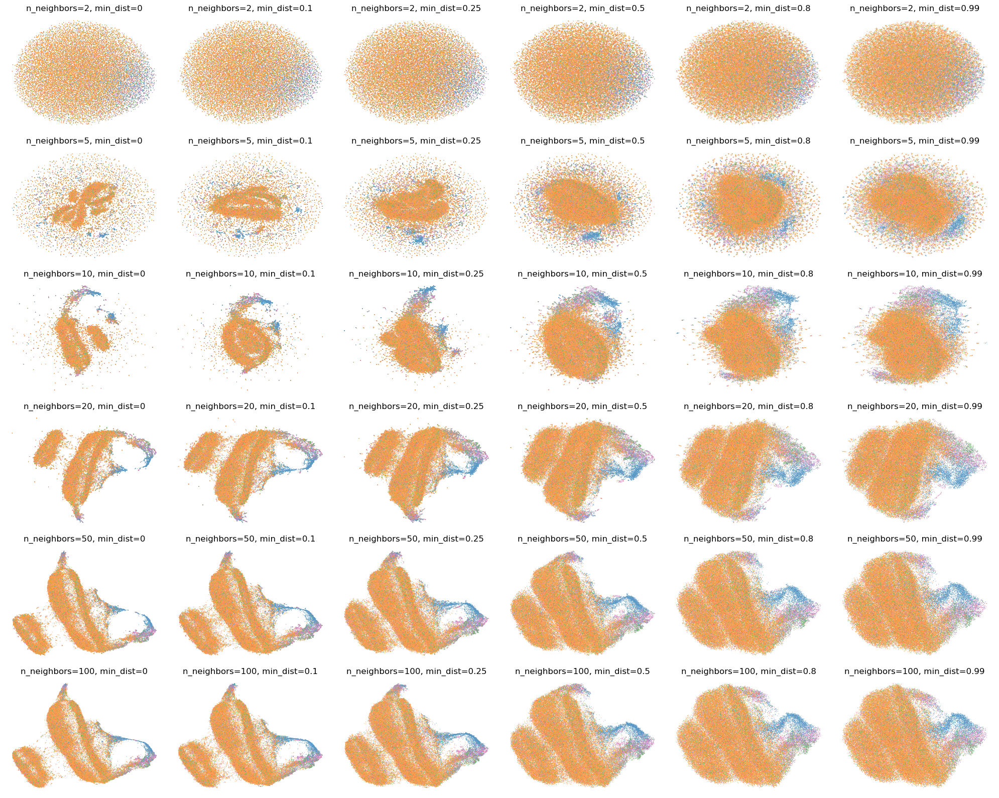

In [6]:
# Plot the embeddings
min_dist_list = [0, 0.1, 0.25, 0.5, 0.8, 0.99]
n_neighbors_list = [2, 5, 10, 20, 50, 100]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(20, 16))

for i in range(len(n_neighbors_list)):
    for j in range(len(min_dist_list)):
        
        embedding = embeddings[f"neighbors_{n_neighbors_list[i]}_mindist_{min_dist_list[j]}_metric_euclidean"]
        
    
        # Create pandas dataframe combining embedding and cell type annotation
        df = pd.DataFrame(embedding, columns=['X', 'Y'])

        # Append cell type annotation to the dataframe
        df['celltype'] = st_data.obs['annotation_own_score_genes'].reset_index(drop=True)
        
        sns.scatterplot(data=df, x='X', y='Y', hue='celltype', ax=axes[i, j], s=0.5)
        
        # Turn off legend
        axes[i, j].get_legend().remove()
        axes[i, j].axis('off')
        axes[i, j].set_title(f"n_neighbors={n_neighbors_list[i]}, min_dist={min_dist_list[j]}")
    
plt.tight_layout()
plt.show()


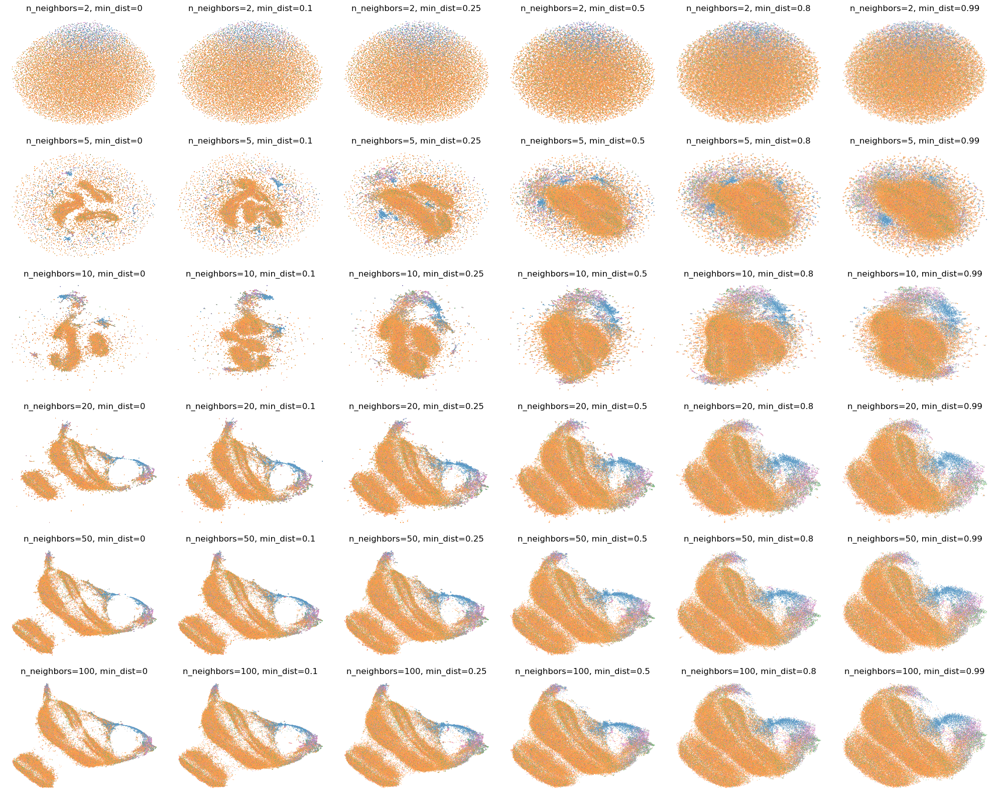

In [8]:
# Plot the cosine embeddings
min_dist_list = [0, 0.1, 0.25, 0.5, 0.8, 0.99]
n_neighbors_list = [2, 5, 10, 20, 50, 100]

fig, axes = plt.subplots(len(n_neighbors_list), len(min_dist_list), figsize=(20, 16))

for i in range(len(n_neighbors_list)):
    for j in range(len(min_dist_list)):
        
        embedding = embeddings[f"neighbors_{n_neighbors_list[i]}_mindist_{min_dist_list[j]}_metric_cosine"]
        
    
        # Create pandas dataframe combining embedding and cell type annotation
        df = pd.DataFrame(embedding, columns=['X', 'Y'])

        # Append cell type annotation to the dataframe
        df['celltype'] = st_data.obs['annotation_own_score_genes'].reset_index(drop=True)
        
        sns.scatterplot(data=df, x='X', y='Y', hue='celltype', ax=axes[i, j], s=0.5)
        
        axes[i, j].get_legend().remove()
        axes[i, j].axis('off')
        axes[i, j].set_title(f"n_neighbors={n_neighbors_list[i]}, min_dist={min_dist_list[j]}")
    
plt.tight_layout()
plt.show()


In [9]:
# Get the best UMAP embeddings
st_data.obsm['covet_umap'] = embeddings[f"neighbors_20_mindist_0_metric_euclidean"]
st_data.obsm['covet_sqrt_flat'] = covet_sqrt

# Leiden

In [10]:
sc.pp.neighbors(st_data, n_neighbors=20,
                use_rep='covet_sqrt_flat',
                method='umap', metric='euclidean',
                n_pcs=st_data.obsm["covet_sqrt_flat"].shape[1],
                key_added='neighbors_covet')

In [11]:
sc.tl.leiden(
    st_data,
    resolution=0.5,
    key_added='leiden_covet',
    neighbors_key='neighbors_covet',
    flavor="igraph"
)

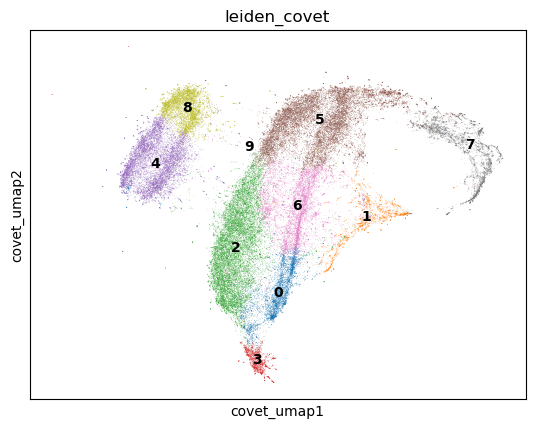

In [12]:
sc.pl.embedding(st_data, basis='covet_umap', color='leiden_covet',
                legend_loc='on data', s=0.5)

In [26]:
output_file_path = f"../rds/vizgen_covet_clusters_and_umap.csv"
obs_data = st_data.obs[['leiden_covet']]
umap_data = pd.DataFrame(st_data.obsm['covet_umap'], columns=['UMAP1', 'UMAP2'], index=st_data.obs_names)
combined_data = pd.concat([obs_data, umap_data], axis=1)
combined_data.to_csv(output_file_path)

<Axes: title={'center': 'leiden'}, xlabel='spatial1', ylabel='spatial2'>

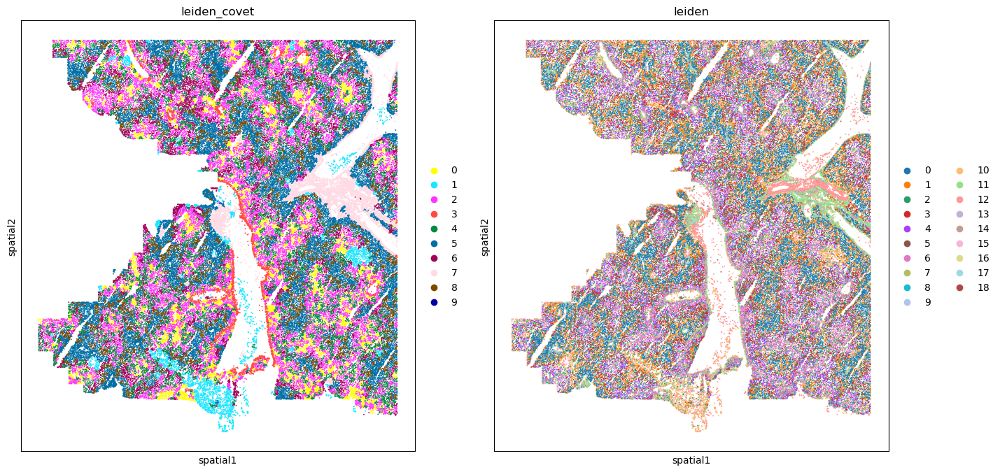

In [80]:
# Plot UMAP of COVET embeddings vs normal UMAP
# Create subplot of two columns
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Plot Covet UMAP
sc.pl.embedding(st_data, basis='spatial', color='leiden_covet', size=7, ax=axes[0], show=False)

# Plot normal UMAP
sc.pl.embedding(st_data, basis='spatial', color='leiden', size=7, ax=axes[1], show=False)

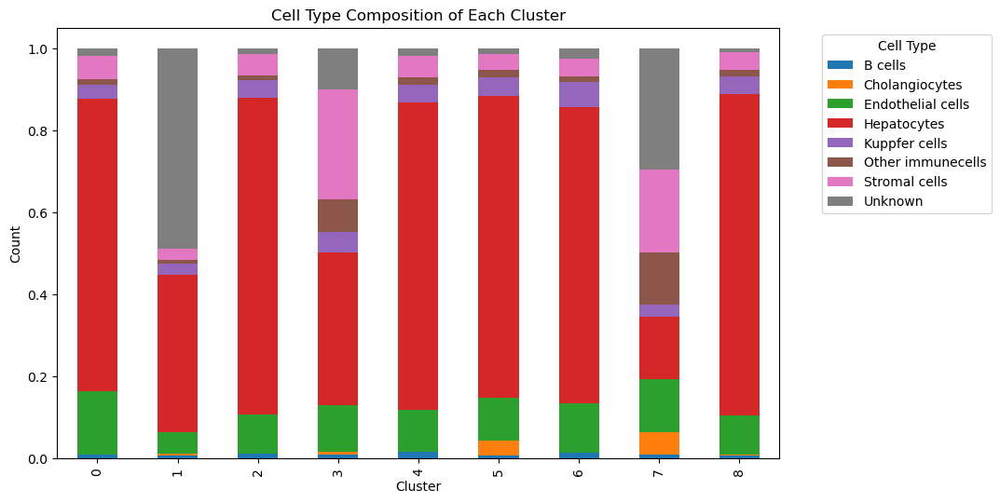

In [93]:
# Group the dataframe by cluster and cell type, and count the occurrences
grouped_df = st_data.obs.groupby(['leiden_covet', 'annotation_own_score_genes']).size().unstack()

# Normalize the counts to get the proportion of each cell type in each cluster
grouped_df = grouped_df.div(grouped_df.sum(axis=1), axis=0)

# Filter to only clusters with more than 1000 cells
grouped_df = grouped_df.loc[st_data.obs['leiden_covet'].value_counts() > 1000, ]

# Plot the stacked barplot
grouped_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Set the labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Cell Type Composition of Each Cluster')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1))

## KC subset

In [12]:
# Cluster on only KCs
kcs = st_data[st_data.obs['annotation_own_score_genes'] == 'Kuppfer cells', :]

In [13]:
kcs

View of AnnData object with n_obs × n_vars = 3309 × 347
    obs: 'region', 'instance', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'leiden', 'Endothelial cells', 'Stromal cells', 'Hepatocytes', 'Cholangiocytes', 'HsPCs', 'cDC2s', 'Mig. cDCs', 'Monocytes and Monocytes-derived cells', 'Neutrophils', 'Basophils', 'NK cells', 'ILC1s', 'T cells', 'pDCs', 'B cells', 'cDC1s', 'Kuppfer cells', 'Cleanliness', 'annotation', 'Hep', 'score_celltype_own_score_genes', 'second_score_celltype_own_score_genes', 'cleanliness_own_score_genes', 'annotation_own_score_genes_start_iterative', 'annotation_own_score_genes', 'leiden_covet'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'annotation_colors', 'annot

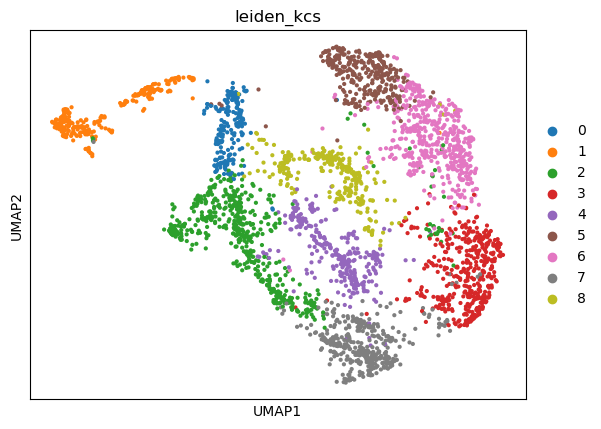

In [14]:
sc.pp.neighbors(kcs, use_rep='covet_sqrt_flat', n_neighbors=20)
sc.tl.umap(kcs, min_dist=0)
sc.tl.leiden(
    kcs,
    resolution=0.75,
    flavor="igraph",
    key_added='leiden_kcs'
)

sc.pl.umap(kcs, color=['leiden_kcs'])

In [15]:
# Match the leiden clusters to the original data, NA if not KC
st_data.obs['leiden_covet_kcs'] = np.nan
st_data.obs['leiden_covet_kcs'][st_data.obs['annotation_own_score_genes'] == 'Kuppfer cells'] = kcs.obs['leiden_kcs'].values

/tmp/ipykernel_109486/1272728905.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  st_data.obs['leiden_covet_kcs'][st_data.obs['annotation_own_score_genes'] == 'Kuppfer cells'] = kcs.obs['leiden_kcs'].values
/tmp/ipykernel_109486/127272890

<Axes: title={'center': 'leiden_covet_kcs'}, xlabel='spatial1', ylabel='spatial2'>

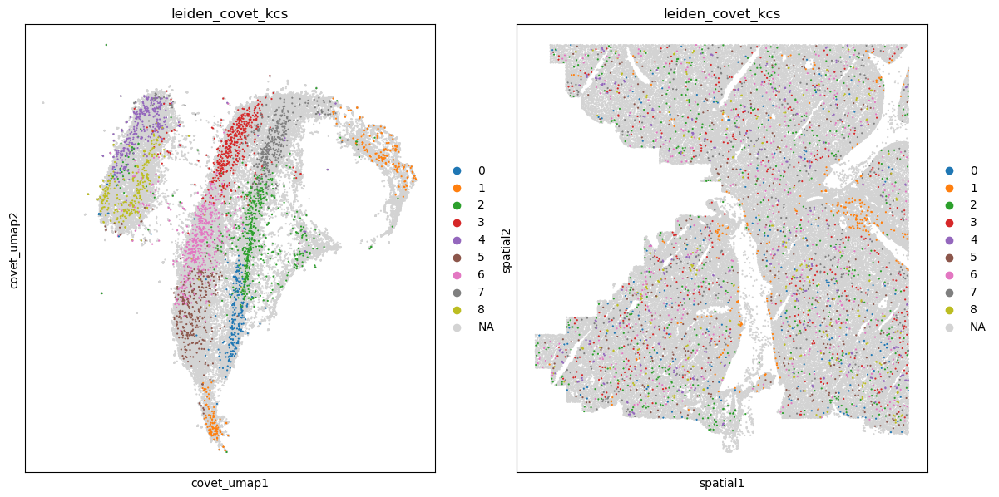

In [107]:
# Create 2 subplots
fig, ax = plt.subplots(1, 2, figsize=(14, 7))

sc.pl.embedding(st_data, basis='covet_umap', color='leiden_covet_kcs', size=10, ax=ax[0], show=False)
sc.pl.embedding(st_data, basis='spatial', color='leiden_covet_kcs', size=10,  ax=ax[1], show=False)


## Try doing very simple k-nearest neighbors + clustering

In [6]:
import squidpy as sq
from sklearn.cluster import KMeans

In [7]:
sq.gr.spatial_neighbors(st_data, spatial_key='spatial', n_neighs=8)
st_data.obs["annotation_own_score_genes"] = st_data.obs["annotation_own_score_genes"].astype("category")
sq.gr.nhood_enrichment(st_data, cluster_key="annotation_own_score_genes")

100%|██████████| 1000/1000 [00:02<00:00, 460.81/s]


In [8]:
def compute_neighborhood_df(adata, cell_type_col, spatial_connectivities_col,
                            normalize_percentage=False):
    cell_types = adata.obs[cell_type_col]
    
    # Convert cell type annotations to integer labels
    unique_types, labels = np.unique(cell_types, return_inverse=True)
    
    # Get indices of non-zero elements
    nonzero_indices = np.argwhere(adata.obsp[spatial_connectivities_col] == 1)

    # Get indices of nearest neighbors for each row
    neighbor_indices = nonzero_indices[:, 1].reshape((-1, 8))

    # Get cell types of nearest neighbors
    nearest_neighbor_types = labels[neighbor_indices]

    # Count occurrences of each cell type in the neighborhood
    neighbor_counts = np.apply_along_axis(lambda x: np.bincount(x, minlength=len(unique_types)),
                                          axis=1, arr=nearest_neighbor_types)
    
    if (normalize_percentage):
        # Normalize counts to get percentages
        neighbor_counts = neighbor_counts / np.sum(neighbor_counts, axis=1, keepdims=True)

    return pd.DataFrame(neighbor_counts, columns=unique_types)

In [9]:
neighbor_composition_df = compute_neighborhood_df(st_data, 'annotation_own_score_genes', 'spatial_connectivities')

In [10]:
# Cluster cells according to the composition of their neighborhoods
n_clusters = 5  # Number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(neighbor_composition_df)

st_data.obs['neighborhood_cluster'] = cluster_labels
st_data.obs['neighborhood_cluster'] = st_data.obs['neighborhood_cluster'].astype('category')

In [11]:
neighbor_composition_df_norm = compute_neighborhood_df(st_data, 'annotation_own_score_genes', 'spatial_connectivities', normalize_percentage=True)
neighbor_composition_df_norm['cluster'] = cluster_labels
neighbor_composition_df_norm = pd.melt(neighbor_composition_df_norm, id_vars=['cluster'], var_name='celltype', value_name='percentage')

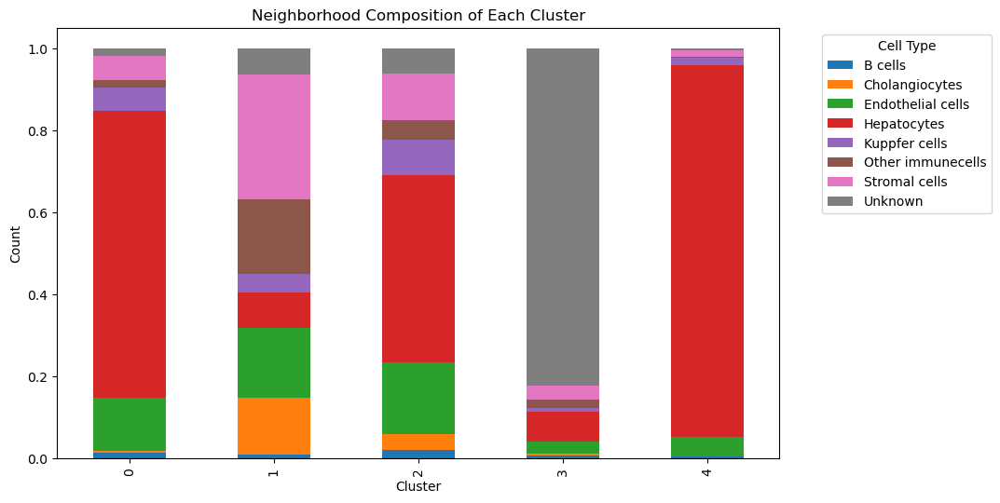

In [23]:
# Pivot mean_neighborhood_composition to wide format
mean_neighborhood_composition = neighbor_composition_df_norm.groupby(['cluster', 'celltype']).mean().reset_index()
mean_neighborhood_composition = mean_neighborhood_composition.pivot(index='cluster', columns='celltype', values='percentage')

# Plot stacked barplot
mean_neighborhood_composition.plot(kind='bar', stacked=True, figsize=(10, 6))

# Set the labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Neighborhood Composition of Each Cluster')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1))

/tmp/ipykernel_58306/3421929188.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_df = st_data.obs.groupby(['neighborhood_cluster', 'annotation_own_score_genes']).size().unstack()


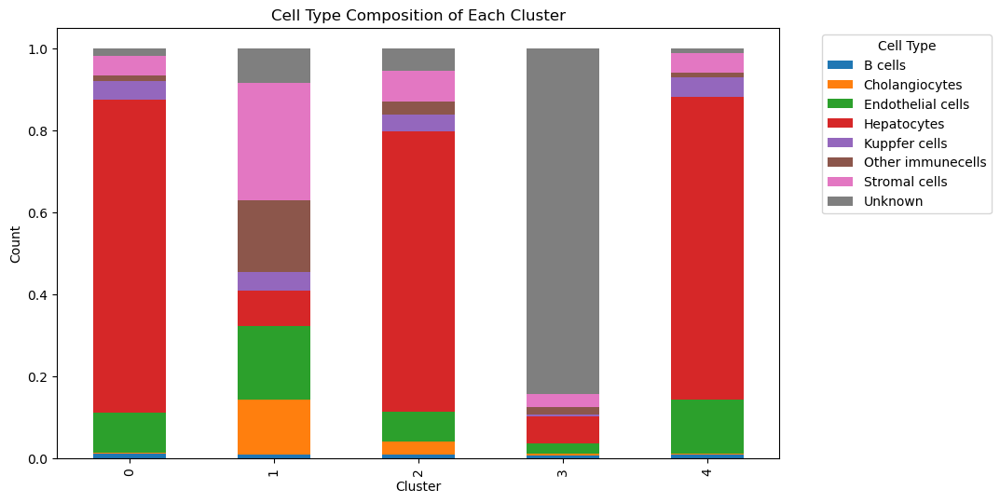

In [22]:
# Group the dataframe by cluster and cell type, and count the occurrences
grouped_df = st_data.obs.groupby(['neighborhood_cluster', 'annotation_own_score_genes']).size().unstack()

# Normalize the counts to get the proportion of each cell type in each cluster
grouped_df = grouped_df.div(grouped_df.sum(axis=1), axis=0)

# Plot the stacked barplot
grouped_df.plot(kind='bar', stacked=True, figsize=(10, 6))

# Set the labels and title
plt.xlabel('Cluster')
plt.ylabel('Count')
plt.title('Cell Type Composition of Each Cluster')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1))

In [21]:
st_data.obs[['neighborhood_cluster', 'annotation_own_score_genes']]

,neighborhood_cluster,annotation_own_score_genes
cells,,
129,4,Unknown
260,2,Unknown
261,0,Unknown
321,0,Hepatocytes
453,0,Unknown
...,...,...
348310,0,Hepatocytes
348438,0,Hepatocytes
348566,0,Hepatocytes


<Axes: xlabel='cluster,celltype'>

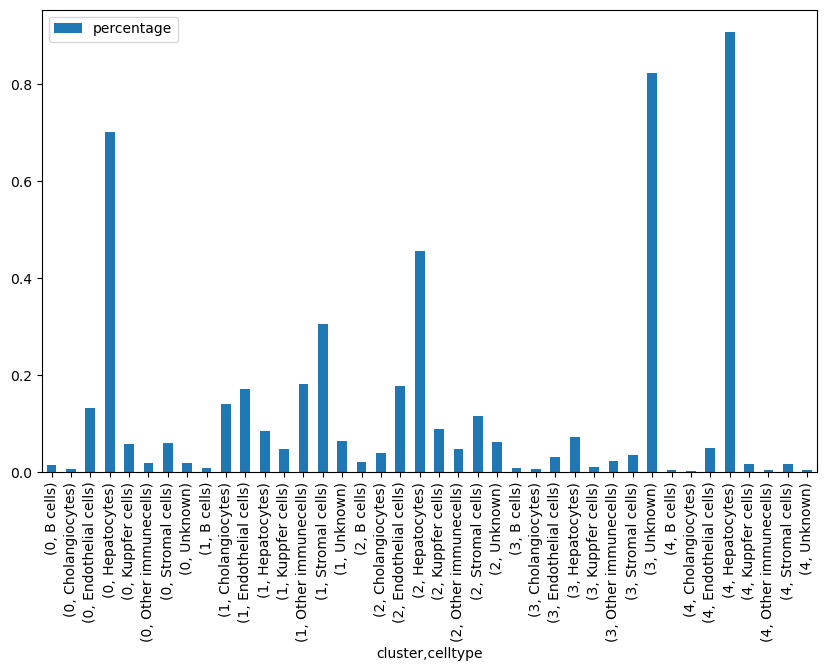

In [15]:
neighbor_composition_df_norm

# Get mean neighborhood composition per cluster
mean_neighborhood_composition = neighbor_composition_df_norm.groupby(['cluster', 'celltype']).mean()

# Plot a stacked barplot of the mean neighborhood composition
mean_neighborhood_composition.plot(kind='bar', stacked=True, figsize=(10, 6))

# # Set the labels and title
# plt.xlabel('Cluster')
# plt.ylabel('Count')
# plt.title('Cell Type Composition of Each Cluster')
# plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1))

In [ ]:


# Calculate the mean of neighborhood composition for each cluster
mean_composition = neighbor_composition_df.mean()

# Plot the barplot
plt.bar(mean_composition.index, mean_composition.values)
plt.xlabel('Cluster')
plt.ylabel('Mean Composition')
plt.title('Mean Neighborhood Composition for Each Cluster')
plt.show()

<Figure size 1000x600 with 0 Axes>

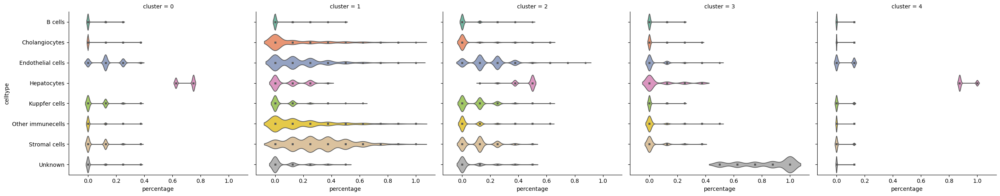

In [178]:

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.catplot(data=neighbor_composition_df_norm, x='percentage', y='celltype', hue='celltype',
            col='cluster', palette='Set2', kind="violin", inner="point")

# Show the plot
plt.tight_layout()
plt.show()


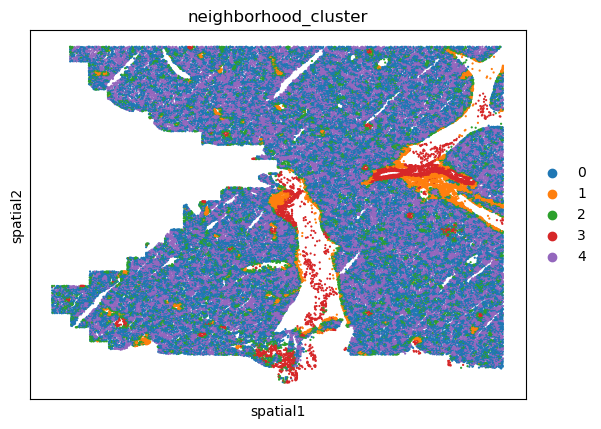

In [21]:
# Plot clusters on the spatial plot
sc.pl.embedding(st_data, basis='spatial', color='neighborhood_cluster', size=10)

In [22]:
# Cluster cells according to the composition of their neighborhoods
neighbor_composition_df_subset = neighbor_composition_df[(st_data.obs['annotation_own_score_genes'] == 'Kuppfer cells').values]

n_clusters = 5  # Number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(neighbor_composition_df_subset)

# Add the neighborhood cluster labels to Kuppfer cells in the original data
st_data.obs['neighborhood_cluster_kcs'] = np.nan

# Make sure cluster labels is categorical
st_data.obs['neighborhood_cluster_kcs'][st_data.obs['annotation_own_score_genes'] == 'Kuppfer cells'] = cluster_labels
st_data.obs['neighborhood_cluster_kcs'] = st_data.obs['neighborhood_cluster_kcs'].astype('category')


/tmp/ipykernel_109486/2299998769.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  st_data.obs['neighborhood_cluster_kcs'][st_data.obs['annotation_own_score_genes'] == 'Kuppfer cells'] = cluster_labels
/tmp/ipykernel_109486/2299998769.py:

<Axes: title={'center': 'neighborhood_cluster_kcs'}, xlabel='spatial1', ylabel='spatial2'>

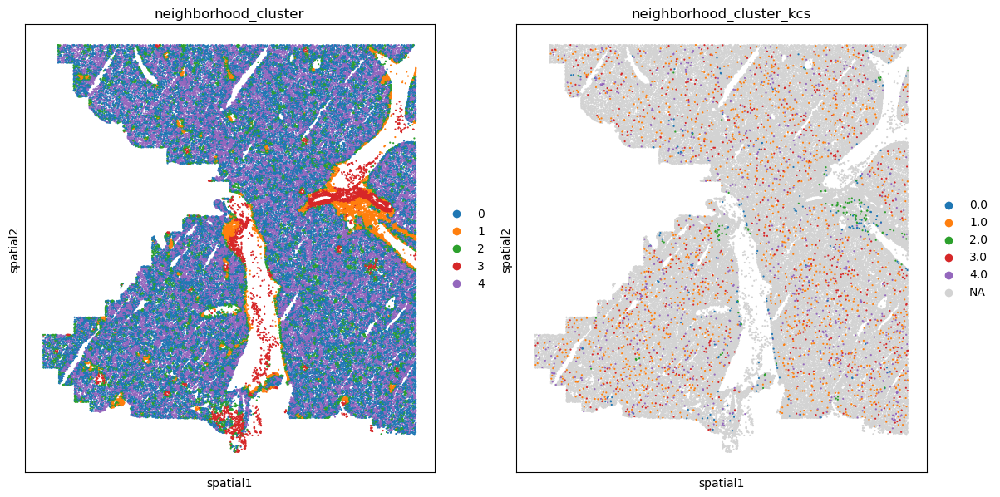

In [152]:
# Plot clusters on the spatial plot
fig, ax = plt.subplots(1, 2, figsize=(14, 7))
sc.pl.embedding(st_data, basis='spatial', color='neighborhood_cluster', size=10, ax=ax[0], show=False)
sc.pl.embedding(st_data, basis='spatial', color='neighborhood_cluster_kcs', size=10, ax=ax[1], show=False)

/home/chananchidas/miniconda3/envs/scenvi/lib/python3.10/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/chananchidas/miniconda3/envs/scenvi/lib/python3.10/site-packages/squidpy/pl/_utils.py:557: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  row_labels = adata.obs[key][row_order]


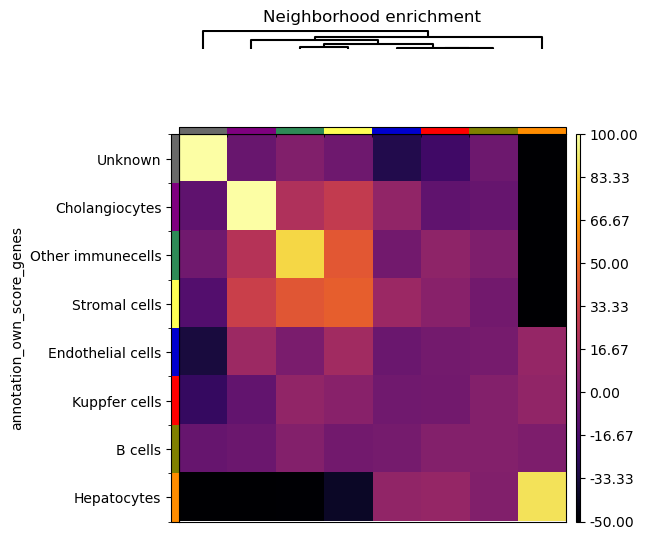

In [244]:
sq.pl.nhood_enrichment(
    st_data,
    cluster_key="annotation_own_score_genes",
    method="average",
    cmap="inferno",
    vmin=-50,
    vmax=100,
    figsize=(5, 5),
)


In [26]:
st_data.write_h5ad("vizgen_data_with_clusters.h5ad")

In [23]:
st_data = sc.read_h5ad("vizgen_data_with_clusters.h5ad")

In [24]:
st_data

AnnData object with n_obs × n_vars = 75890 × 347
    obs: 'region', 'instance', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes', 'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize', 'leiden', 'Endothelial cells', 'Stromal cells', 'Hepatocytes', 'Cholangiocytes', 'HsPCs', 'cDC2s', 'Mig. cDCs', 'Monocytes and Monocytes-derived cells', 'Neutrophils', 'Basophils', 'NK cells', 'ILC1s', 'T cells', 'pDCs', 'B cells', 'cDC1s', 'Kuppfer cells', 'Cleanliness', 'annotation', 'Hep', 'score_celltype_own_score_genes', 'second_score_celltype_own_score_genes', 'cleanliness_own_score_genes', 'annotation_own_score_genes_start_iterative', 'annotation_own_score_genes', 'leiden_covet', 'leiden_covet_kcs', 'neighborhood_cluster', 'neighborhood_cluster_kcs'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'mean', 'std', 'highly_variable', 'means', 'disp

In [28]:
# Write the following columns to files
# .obsm: COVET, COVET_SQRT, covet_umap, covet_sqrt_flat
# .obs: leiden_covet, leiden_covet_kcs, neighborhood_cluster, neighborhood_cluster_kcs

#st_data.obsm[['COVET', 'COVET_SQRT', 'covet_umap', 'covet_sqrt_flat']]

st_data.obs[['leiden_covet', 'leiden_covet_kcs', 'neighborhood_cluster', 'neighborhood_cluster_kcs']].to_csv("vizgen_cluster_labels.csv")